# Analysing eigenvalue energy level breakdown of RWA

To do so, we will vary various parameters to see when the hamiltonian due to RWA is significantly different in comparison to the the (quantum rabi) model including terms that do not preserve total excitation number.

As discussed in the theory and deeivation, we are comparing the following 2 hamiltonians:




Loaded in python Qutip

In [10]:
from qutip import *

# g : coupling strength
# wr : resonator frequency
# wt : qubit frequency
# N : truncates resonator hilbert space

def HamiltonianJaynesCummings(g : float, wr : float, wt : float, N : int) -> Qobj:
    a = destroy(N)
    return tensor(a.dag()*a, qeye(2))*wr + 0.5*wr - 0.5*wt*tensor(qeye(N), sigmaz()) + g*(tensor(a.dag(),sigmap()) + tensor(a,sigmam()))

def HamiltonianRabi(g : float, wr : float, wt : float, N : int) -> Qobj:
    a = destroy(N)
    return tensor(a.dag()*a, qeye(2))*wr + 0.5*wr - 0.5*wt*tensor(qeye(N), sigmaz()) + g*tensor(a.dag() + a, qeye(2))*tensor(qeye(N), sigmap() + sigmam())

In the code, the tensor products are included to match the hamiltonian dimensions. As the live in a combined space of resonator and two level system. Let us create these hamiltonians for a small resonator space and see if the difference in structure. 

In addition, hbar is approximated as 1, as it is only a scalar!

In [11]:
N = 3
wt = 1.0
wr = 1.0
g = 0.1 # weak coupling

H_JC = HamiltonianJaynesCummings(g, wr, wt, N)
H_Rabi = HamiltonianRabi(g, wr, wt, N)
print("Jaynes-Cummings Hamiltonian:\n", H_JC)
print("\nRabi Hamiltonian:\n", H_Rabi)

Jaynes-Cummings Hamiltonian:
 Quantum object: dims=[[3, 2], [3, 2]], shape=(6, 6), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0.         0.         0.         0.         0.         0.        ]
 [0.         1.         0.1        0.         0.         0.        ]
 [0.         0.1        1.         0.         0.         0.        ]
 [0.         0.         0.         2.         0.14142136 0.        ]
 [0.         0.         0.         0.14142136 2.         0.        ]
 [0.         0.         0.         0.         0.         3.        ]]

Rabi Hamiltonian:
 Quantum object: dims=[[3, 2], [3, 2]], shape=(6, 6), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0.         0.         0.         0.1        0.         0.        ]
 [0.         1.         0.1        0.         0.         0.        ]
 [0.         0.1        1.         0.         0.         0.14142136]
 [0.1        0.         0.         2.         0.14142136 0.        ]
 [0.         0.         0.         0.14142136 2.         

We can clearly block diagonal structure for the jaynes cummings hamiltonian which is the rabi hamiltonian after neglecting terms that do not preserve total excitation number. The nth block is given by:



In [12]:
def H_JC_block(n : int, g : float, wr : float, wt : float) -> Qobj:
    detuning = wt - wr
    return Qobj([[n*wr, g*(n)**0.5],
                 [g*(n)**0.5, n*wr + detuning]])
print("\nJaynes-Cummings Hamiltonian Block for n=1:\n", H_JC_block(1, g, wr, wt))
print("\nJaynes-Cummings Hamiltonian Block for n=2:\n", H_JC_block(2, g, wr, wt))


Jaynes-Cummings Hamiltonian Block for n=1:
 Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[1.  0.1]
 [0.1 1. ]]

Jaynes-Cummings Hamiltonian Block for n=2:
 Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[2.         0.14142136]
 [0.14142136 2.        ]]


## Truncation of resonator hilbert space

We have chosen to truncate the hilbert space at N = 5. For larger hilbert spaces, we see similar effects, just there are many energy levels to plot. As the RWA matrix is block diagonal, its truncation level will not affect the eigen energy values. Each block has its own 2 eigenvalues. Hence truncation only leads to seeing fewer energy states, but the same. 

For the Rabi model, we need to check that the energy levels stay similar with higher and lower truncation.

To do this, we can select the first 10 energy levels for a truncation level of 5 and 100 and compare if they differ significantly. 

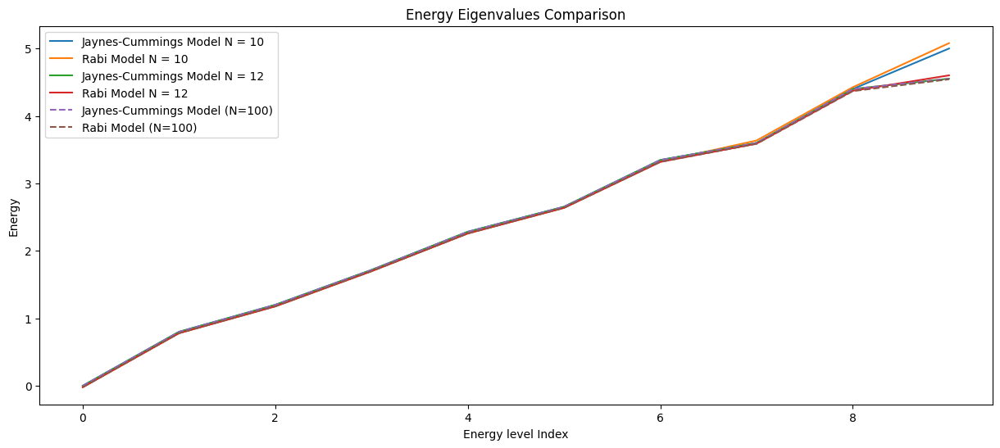

In [13]:
import matplotlib.pyplot as plt
N_LEVELS = 10
plt.subplots(figsize=(15,6))
H_JC_5 = HamiltonianJaynesCummings(g=0.2, wr=1.0, wt=1.0, N=5)
H_RABI_5 = HamiltonianRabi(g=0.2, wr=1.0, wt=1.0, N=5)
eigenvals_JC = H_JC_5.eigenenergies()
eigenvals_RABI = H_RABI_5.eigenenergies()
# first with JC model truncated at 5
plt.plot(eigenvals_JC[:N_LEVELS], label="Jaynes-Cummings Model N = 10")
plt.plot(eigenvals_RABI[:N_LEVELS], label="Rabi Model N = 10")
H_JC_6 = HamiltonianJaynesCummings(g=0.2, wr=1.0, wt=1.0, N=6)
H_RABI_6 = HamiltonianRabi(g=0.2, wr=1.0, wt=1.0, N=6)
eigenvals_JC_6 = H_JC_6.eigenenergies()
eigenvals_RABI_6 = H_RABI_6.eigenenergies()
# first with JC model truncated at 6
plt.plot(eigenvals_JC_6[:N_LEVELS], label="Jaynes-Cummings Model N = 12")
plt.plot(eigenvals_RABI_6[:N_LEVELS], label="Rabi Model N = 12")
# Now with higher truncation
H_JC_100 = HamiltonianJaynesCummings(g=0.2, wr=1.0, wt=1.0, N=100)
H_Rabi_100 = HamiltonianRabi(g=0.2, wr=1.0, wt=1.0, N=100)
eigenvals_JC_100 = H_JC_100.eigenenergies()
eigenvals_RABI_100 = H_Rabi_100.eigenenergies()
plt.plot(eigenvals_JC_100[:N_LEVELS], label="Jaynes-Cummings Model (N=100)", linestyle='--')
plt.plot(eigenvals_RABI_100[:N_LEVELS], label="Rabi Model (N=100)", linestyle='--')
plt.xlabel("Energy level Index")
plt.ylabel("Energy")
plt.legend()
plt.title("Energy Eigenvalues Comparison")
plt.legend()
plt.show()

From the plot of energy level eigenvalues for a small truncation space of N = 10 versus a larger space of N = 100, we can conclude the the devition is insigificant untill the 10th (or 9th 0 indexed) energy level. The JC hamiltonian's eigenvalues seem slightly (almost neglidbly) smaller than the Rabi model. It is logical that there is some deviation in the final level as it is at the end of the hilbert space. Therefore, we can truncate our hilbert space at 6 and then deal with the first 10 energy levels. This way the final 10th level is also accurate. With this observation, we can now neglect the truncation of resonator hilbert space as a parameter and focus on using the first 10 eigenstates to explore how varying coupling g and detuning results in breakdown of the RWA.

In [14]:
N_TRUNC = 6
N_LEVELS = 10 

## Analysing effect on eigenenergies

For the block diagonal matrix, we get 2 eigen values (per block). SO we will get up to 2 * N (N blocks) eigenvalues. We can explore how canging the coupling (g), detuning (wt - wr) = delta and truncation of resonator space can affect the eigenergies. In comparison to the Quantum Rabi model.

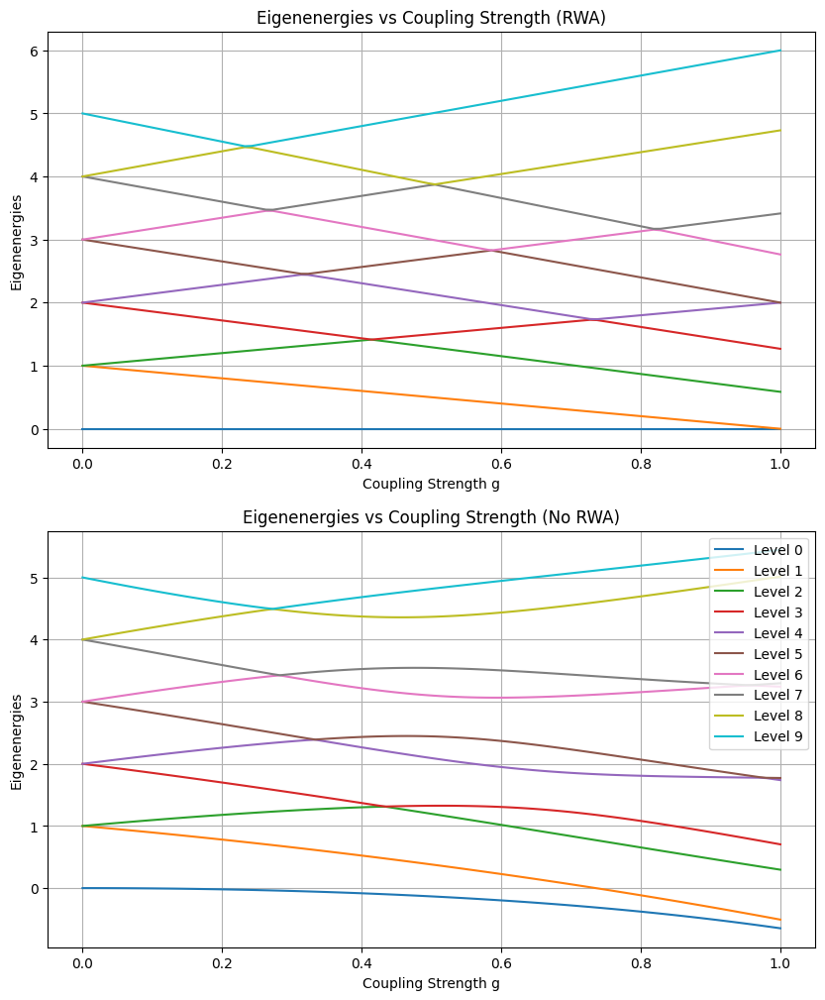

In [ ]:
# Let us plot the energy levels of the jaynes cummings hamiltonian as a function of our chosen varying parameters
import numpy as np
import matplotlib.pyplot as plt
# Let us plot RWA Hamiltonian for varying g (strong coupling)
g_values = np.linspace(0, 1, 100)
eigen_JC_list = []
eigen_full_list = []
for g in g_values:
    H_JC = HamiltonianJaynesCummings(g, wr, wt, N_TRUNC)
    H_FULL = HamiltonianRabi(g, wr, wt, N_TRUNC)
    eigen_JC = H_JC.eigenenergies()[:N_LEVELS]
    eigen_JC_list.append(eigen_JC)
    eigen_Full = H_FULL.eigenenergies()[:N_LEVELS]
    eigen_full_list.append(eigen_Full)
# Plot the eiegen energy levels (with 1 color for each energy level)
plt.figure(figsize=(10, 12))
plt.subplot(2,1,1)
for i in range(N_LEVELS):
    plt.plot(g_values, [eigen_JC_list[j][i] for j in range(len(g_values))], label=f'Level {i}')
plt.xlabel('Coupling Strength g')
plt.ylabel('Eigenenergies')
plt.title('Eigenenergies vs Coupling Strength (RWA)')
plt.grid()
plt.subplot(2,1,2)
for i in range(N_LEVELS):
    plt.plot(g_values, [eigen_full_list[j][i] for j in range(len(g_values))], label=f'Level {i}')
plt.xlabel('Coupling Strength g')
plt.ylabel('Eigenenergies')
plt.title('Eigenenergies vs Coupling Strength (No RWA)')
plt.grid()
plt.legend()
plt.show()

We can clearly see that as the coupling factor g gets stronger (stronger coupling, g > 0.4), the RWA eigenergies start to deviate from the rabi hamiltonian eigenergies significantly. 

Although the RWA seems to capture the essential splitting between energy levels, it becomes less accurate for strongly coupled systems. For example, the 3th and 4th eigenstates never become degenerate for the Rabi model with  1.0 > g > 0.5, but assuming the rotatiung wave approximation results in a degerate eigenvalue of the 3 and the 4th 2 times! This reflectes the fact that with more coupling, the counter rotating terms also contribute more in the Hamiltonian (Rabi) from the coupling term, which thus more substantially controls the eigenvalues. Another example is that the ground and 1st state go practically to 0 for g = 1.0. This is clearly not true for the Rabi model. 

Ground state error  

In [16]:
from matplotlib import animation
from IPython.display import HTML

fig, ax = plt.subplots(1, 1, figsize=(14, 6))
lines_diff = []

for i in range(N_LEVELS):
    l1, = ax.plot([], [], 'o-', label=f'Level {i}')
    lines_diff.append(l1)

wr = 1.0
wt = 1.0
g_values = np.linspace(0, 1, 25)

ax.set_xlim(-0.5, N_LEVELS - 0.5)
ax.set_ylim(-1, 1) 
ax.set_xlabel('Energy Level Index')
ax.set_ylabel('Energy Difference (Rabi - RWA)')
ax.set_title('Energy Difference vs Coupling Strength g')
ax.legend(loc='upper right', fontsize='small')
ax.grid()

def update(frame):
    H_JC = HamiltonianJaynesCummings(g_values[frame], wr, wt, N_TRUNC)
    H_Rabi = HamiltonianRabi(g_values[frame], wr, wt, N_TRUNC)
    eigen_JC = H_JC.eigenenergies()
    eigen_Rabi = H_Rabi.eigenenergies()
    energy_diff = eigen_Rabi - eigen_JC
    for i in range(N_LEVELS):
        lines_diff[i].set_data([i], [energy_diff[i]])
    fig.suptitle(f'Coupling g = {g_values[frame]:.2f}')
    return lines_diff

ani = animation.FuncAnimation(fig, update, frames=len(g_values), blit=True, interval=100)
html_output = ani.to_jshtml()
plt.close(fig)
HTML(html_output)

Animating the different between energy level eigenvalues for Rabi (including counter rotating terms) and RWA Jaynes-Cummings model shows how the discrepancy grows with g visually. After g = 0.3, the deviation is more severe. 

This was at zero detuning, let us now vary the detuning in an animation plot. To do so we are precomputing the energy levels for different detuning and g values.

In [17]:
# We will plot the same figure as above, just now make an HTML animation to see the variation of these levels with detuning
# Animate the eigenenergy vs g plots for varying detuning (detuning=0 frame matches static plots)
g_values = np.linspace(0, 1, 100)
detuning_range = np.linspace(-5, 5, 101)
n_det = len(detuning_range)
n_g = len(g_values)

eigen_JC_grid = np.zeros((n_det, n_g, N_LEVELS))
eigen_Rabi_grid = np.zeros_like(eigen_JC_grid)

for i_det, det in enumerate(detuning_range):
    for i_g, gg in enumerate(g_values):
        # hamiltonians with a g gg and detuning det
        H_JC_tmp = HamiltonianJaynesCummings(gg, wr, wt + det, N_TRUNC)
        H_RABI_tmp = HamiltonianRabi(gg, wr, wt + det, N_TRUNC)
        
        eigen_JC_grid[i_det, i_g, :] = np.sort(H_JC_tmp.eigenenergies())[:N_LEVELS]
        eigen_Rabi_grid[i_det, i_g, :] = np.sort(H_RABI_tmp.eigenenergies())[:N_LEVELS]

Plotting these levels as an animation over detuning. 

In [18]:
# Create animation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
lines_rwa = []
lines_full = []
for i in range(N_LEVELS):
    l1, = ax1.plot([], [], label=f'Level {i}')
    l2, = ax2.plot([], [], label=f'Level {i}')
    lines_rwa.append(l1)
    lines_full.append(l2)

ax1.set_xlim(g_values[0], g_values[-1])
ax1.set_ylim(-2, 10)
ax1.set_xlabel('Coupling Strength g')
ax1.set_ylabel('Eigenenergies')
ax1.set_title('Eigenenergies vs Coupling Strength (RWA)')
ax1.legend(loc='upper right', fontsize='small')
ax1.grid()

ax2.set_xlim(g_values[0], g_values[-1])
ax2.set_ylim(-2, 10)
ax2.set_xlabel('Coupling Strength g')
ax2.set_ylabel('Eigenenergies')
ax2.set_title('Eigenenergies vs Coupling Strength (No RWA)')
ax2.legend(loc='upper right', fontsize='small')
ax2.grid()

def update(frame):
    y1 = eigen_JC_grid[frame]   # shape (n_g, n_levels)
    y2 = eigen_Rabi_grid[frame]
    for i in range(N_LEVELS):
        lines_rwa[i].set_data(g_values, y1[:, i])
        lines_full[i].set_data(g_values, y2[:, i])
    fig.suptitle(f'Detuning Δ = {detuning_range[frame]:.3f}')
    return lines_rwa + lines_full

ani = animation.FuncAnimation(fig, update, frames=n_det, blit=True, interval=100)
html_output = ani.to_jshtml()
plt.close(fig)
HTML(html_output)

Discussion: 